In [1]:
# Supressing warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd 
import numpy as np

In [3]:
# Reading the reddit posts
df = pd.read_csv('reddit_posts_2022_04_12-03_12_51_PM_clean.csv', index_col=0)
preprocessed_reddit_posts = df['clean_selftext_unstemmed_without_numbers'].to_list()

In [4]:
from nltk import TweetTokenizer

# Tokenizing the posts text (useful for stop words inspection and removal)
tt = TweetTokenizer()
tokenized_posts = [tt.tokenize(post) for post in preprocessed_reddit_posts]
# Flatening the list of tokens 
tokenized_posts_flat = [word for post in tokenized_posts for word in post]

In [5]:
import nltk
from nltk.corpus import stopwords

def remove_stopwords(text, stop_words):
    return " ".join([word for word in text if word not in stop_words])

## Clustering

In [6]:
import sys
sys.path.append("../utils/clustering")

In [7]:
from kmeans import plot_elbow
from kmeans import mbkmeans_clusters

from clustering_viz import tsne_viz
from clustering_viz import create_wordcloud

#### TF-IDF + KMEANS

##### Optimal K with elbow method

In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(preprocessed_reddit_posts)

In [9]:
X.shape

(20590, 8957)

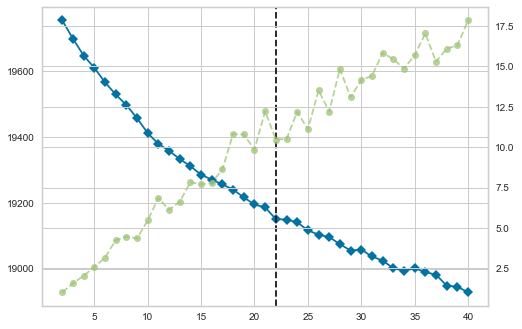

In [15]:
plot_elbow(X, k_range=(2, 41))

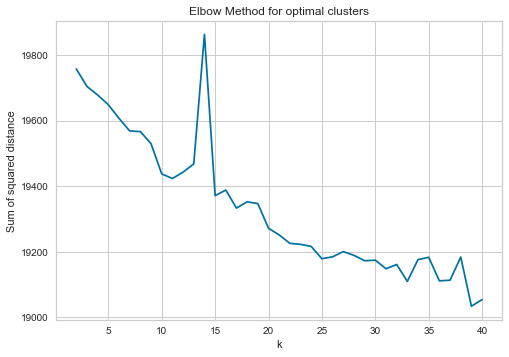

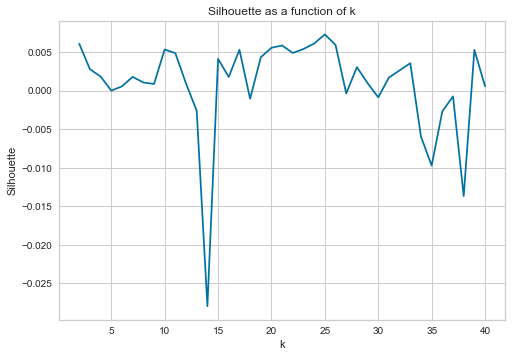

(MiniBatchKMeans(batch_size=1000, n_clusters=40, random_state=21),
 array([ 9,  6,  6, ...,  9, 27,  9]))

In [16]:
mbkmeans_clusters(X, k_range=range(2,41))

Silhouette score:
0.00487261686215023


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

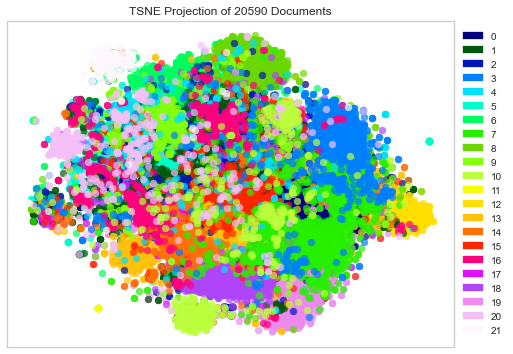

In [19]:
model, labels = mbkmeans_clusters(X, k_range=22)
df_clusters = pd.DataFrame({
    "text": preprocessed_reddit_posts,
    "cluster": labels
})
tsne_viz(X, labels)

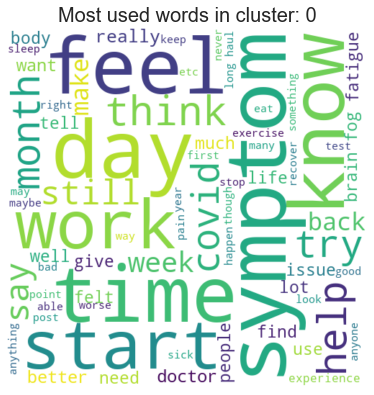

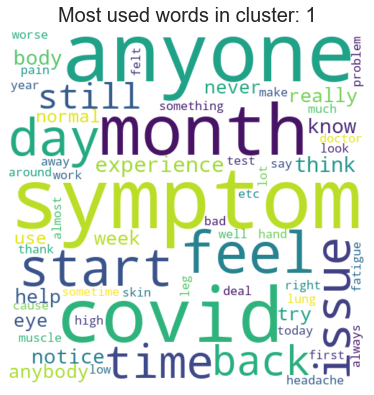

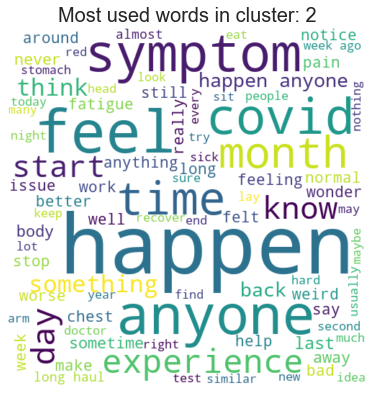

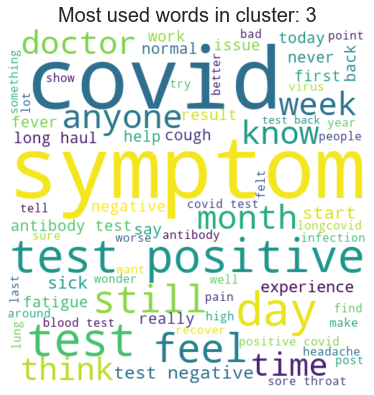

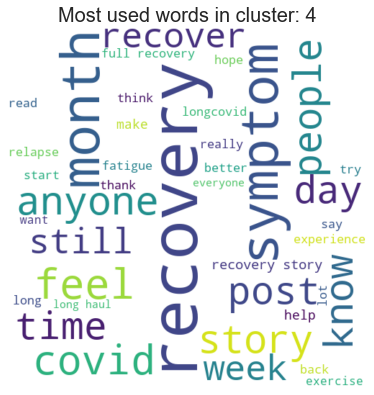

...

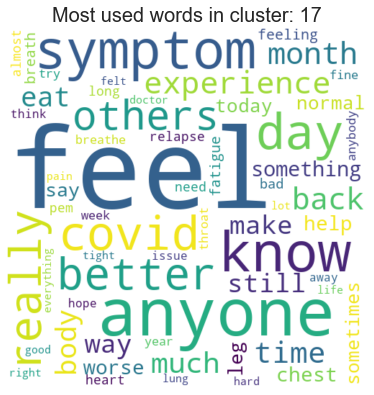

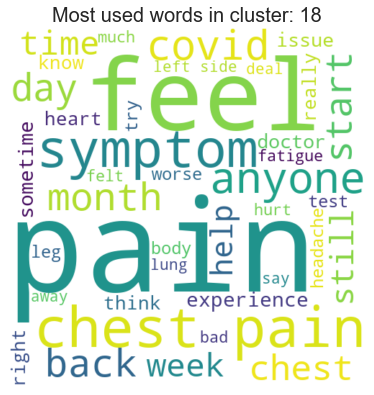

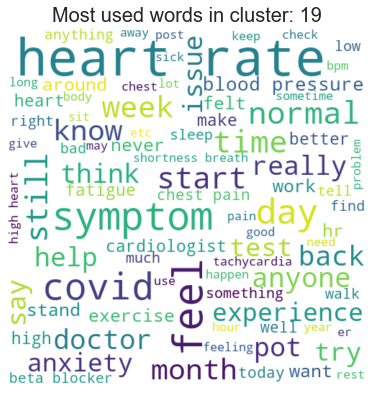

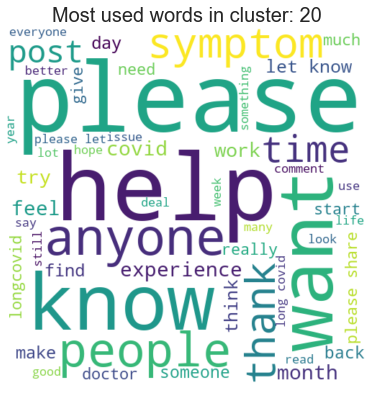

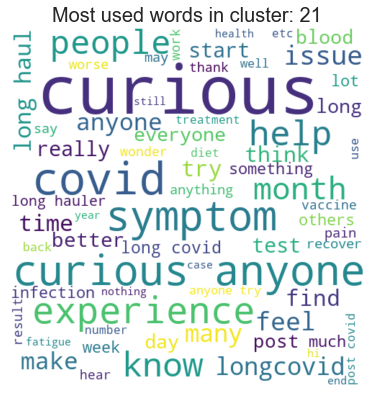

In [21]:
for i in range(0,22):
    create_wordcloud(df_clusters[df_clusters['cluster'] == i]['text'].to_list(), title="Most used words in cluster: " + str(i))

##### Return on some preprocessing: removal of stop words

In [23]:
import collections

# Most common words
collections.Counter(tokenized_posts_flat).most_common()

[('covid', 17306),
 ('like', 16903),
 ('symptom', 15810),
 ('feel', 15616),
 ('day', 13747),
 ('month', 10746),
 ('time', 9766),
 ('week', 9258),
 ('anyone', 9210),
 ('back', 8955),
 ('long', 8921),
 ('test', 8121),
 ('start', 7913),
 ('know', 7837),
 ('pain', 7695),
 ('would', 7644),
 ('help', 7026),
 ('still', 6750),
 ('think', 6734),
 ('work', 6350),
 ('since', 6179),
 ('experience', 5909),
 ('try', 5793),
 ('heart', 5761),
 ('make', 5750),
 ('really', 5691),
 ('could', 5673),
 ('doctor', 5540),
 ('issue', 5455),
 ('say', 5387),
 ('better', 5234),
 ('brain', 5227),
 ('fatigue', 4805),
 ('else', 4729),
 ('want', 4685),
 ('last', 4599),
 ('much', 4569),
 ('normal', 4486),
 ('cannot', 4477),
 ('people', 4420),
 ('felt', 4413),
 ('body', 4397),
 ('year', 4340),
 ('chest', 4296),
 ('first', 4210),
 ('post', 3904),
 ('find', 3714),
 ('sleep', 3600),
 ('bad', 3594),
 ('never', 3585),
 ('blood', 3541),
 ('anxiety', 3533),
 ('fog', 3519),
 ('lot', 3458),
 ('worse', 3446),
 ('something', 3390

In [26]:
# Extending the stop words list for posts
stop_words = stopwords.words('english')
stop_words.extend(['covid', 'long', 'longcovid', 'haul', 'hauler', 'longhauler', 'longhaul', 'lc', 'lh', 'like', 'symptom', 'feel', 'day', 'month', 'time', 'week', 'anyone', 'else', 'back', 'test', 'start', 'know', 'would', 'help', 'still', 'think', 'since', 'experience', 'try', 'make', 'really', 'could', 'issue', 'say', 'want', 'last', 'much', 'normal', 'felt', 'first', 'year', 'post', 'post', 'lot', 'anything', 'tell', 'life', 'well', 'around', 'use', 'positive', 'ago',  'sick', 'give', 'need', 'right', 'many', 'may', 'hour', 'able', 'feeling', 'notice', 'end', 'pretty', 'everything', 'read', 'problem', 'wonder', 'etc', 'point', 'everyone', 'people', 'similar', 'cause', 'negative', 'weird', 'though', 'later', 'next', 'case', 'past', 'march', 'virus', 'couple', 'hi', 'hello', 'hey', 'please', 'someone', 'thanks', 'however', 'story', 'others', 'already', 'finally', 'mostly', 'let', 'call', 'probably', 'question', 'thank', 'thanks', 'yet', 'include', 'december', 'begin', 'stuff'])
# Removing the stop words
posts_without_stop_words = [remove_stopwords(post, stop_words) for post in tokenized_posts]
posts_without_stop_words = [post for post in posts_without_stop_words if post!='']
# Creating new embeddings
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
X = vectorizer.fit_transform(posts_without_stop_words)

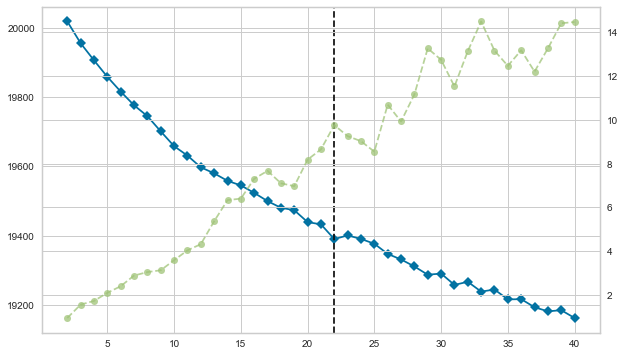

In [27]:
plot_elbow(X, k_range=(2, 41))

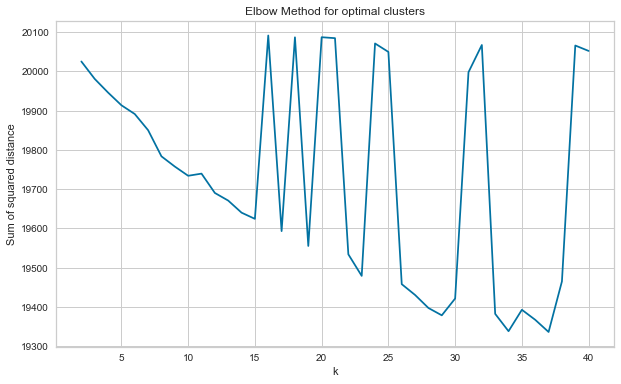

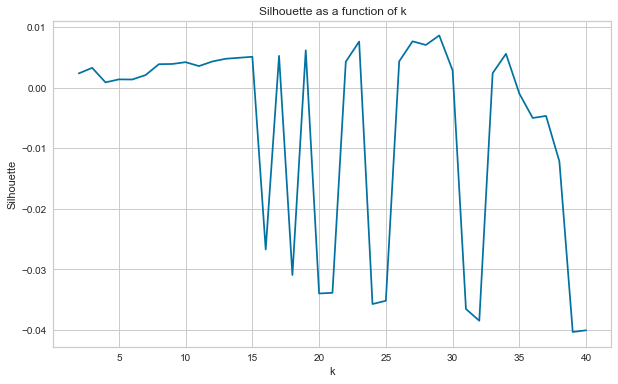

(MiniBatchKMeans(batch_size=1000, n_clusters=40, random_state=21),
 array([21, 21, 21, ..., 21, 21, 21]))

In [29]:
mbkmeans_clusters(X, k_range=range(2,41))

Silhouette score:
0.004268878829355036


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

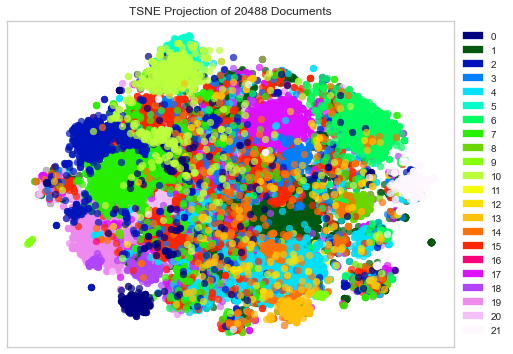

In [30]:
model, labels = mbkmeans_clusters(X, k_range=22)
df_clusters = pd.DataFrame({
    "text": posts_without_stop_words,
    "cluster": labels
})
tsne_viz(X, labels)

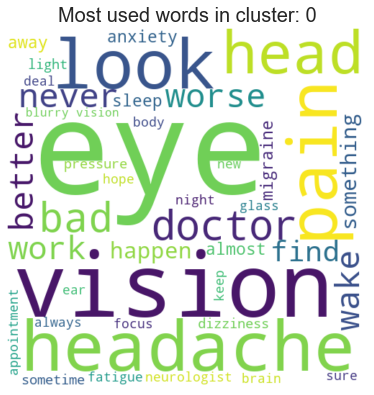

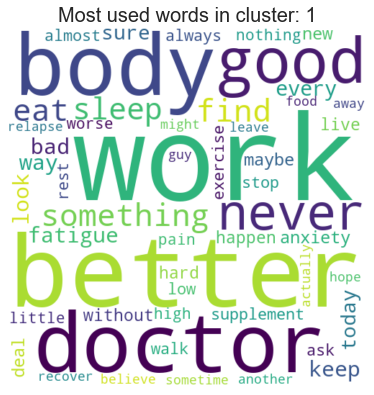

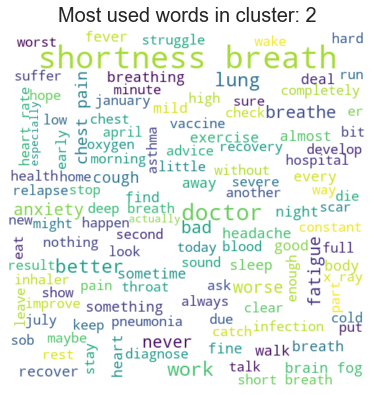

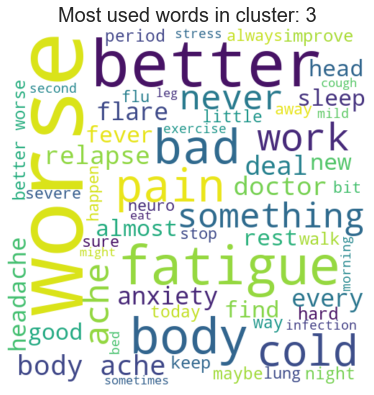

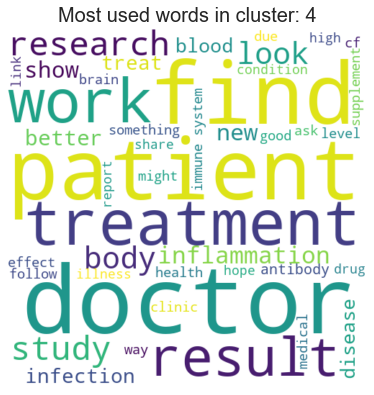

...

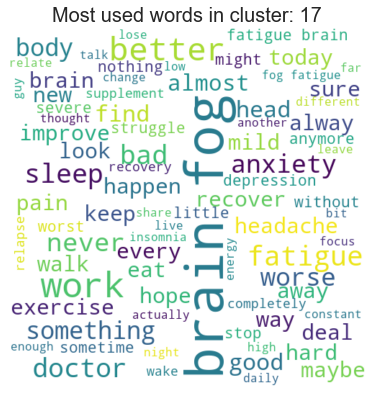

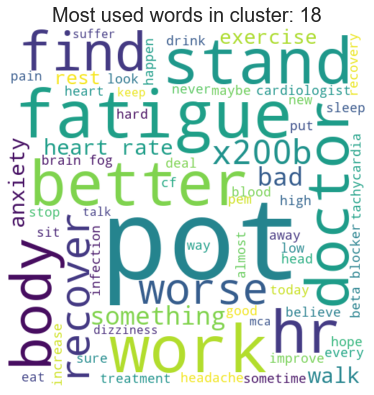

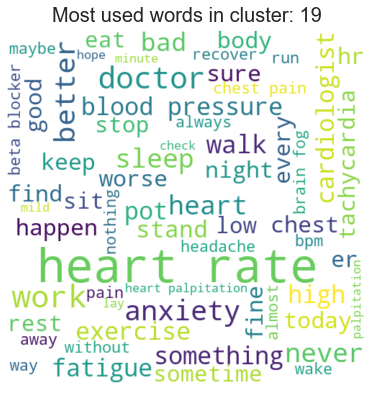

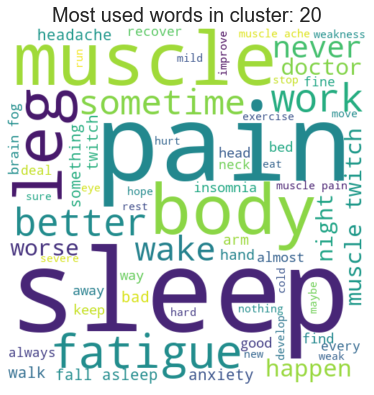

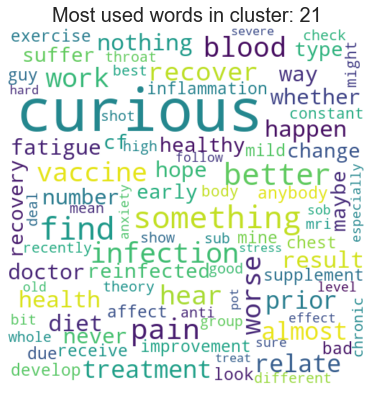

In [32]:
for i in range(0,22):
    create_wordcloud(df_clusters[df_clusters['cluster'] == i]['text'].to_list(), title="Most used words in cluster: " + str(i))

##### Trying a larger number of clusters (elbow method not efficient)

Silhouette score:
0.008598499241838656


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


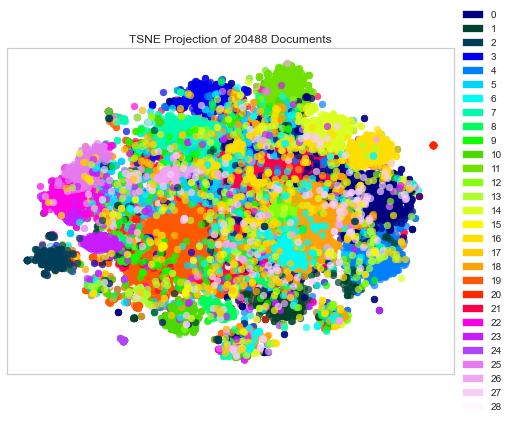

In [34]:
model, labels = mbkmeans_clusters(X, k_range=29)
df_clusters = pd.DataFrame({
    "text": posts_without_stop_words,
    "cluster": labels
})
tsne_viz(X, labels)

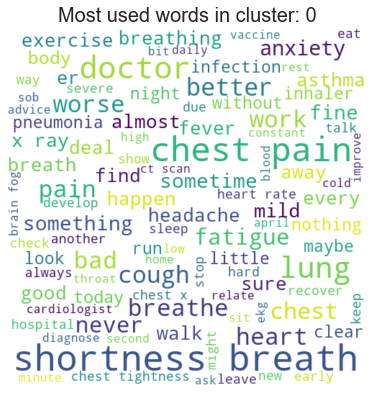

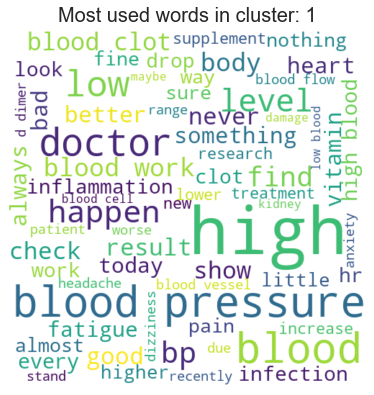

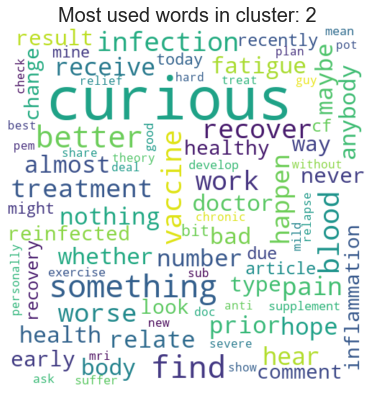

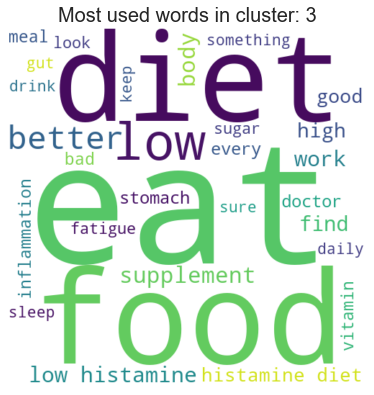

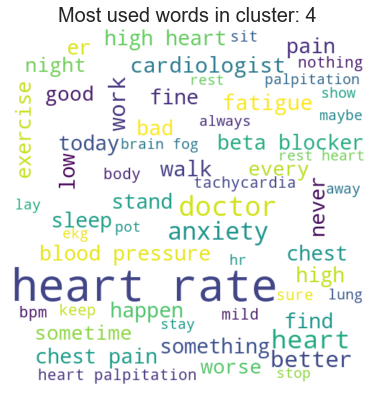

...

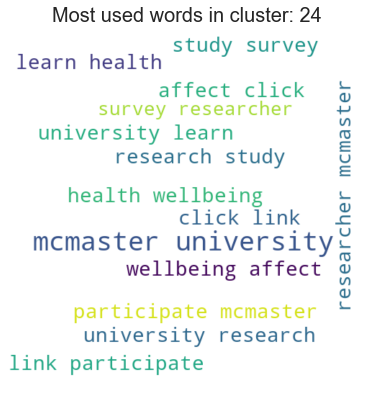

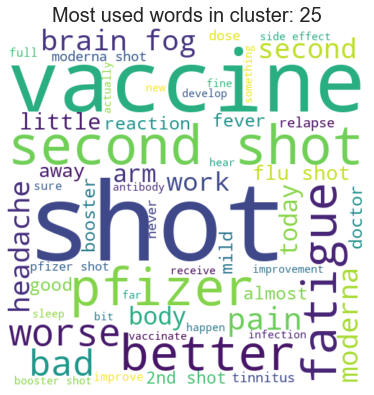

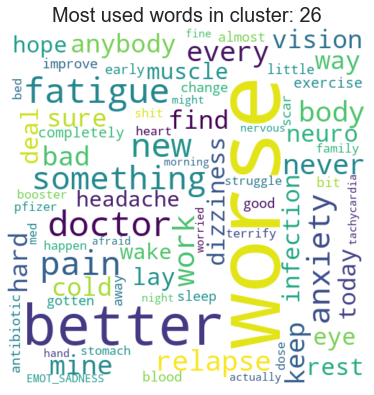

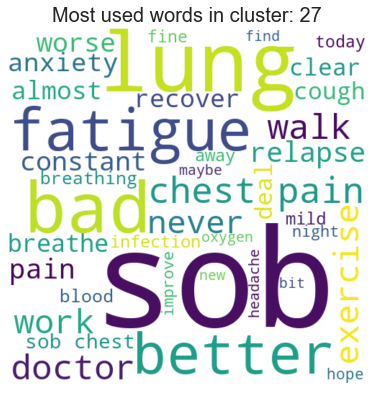

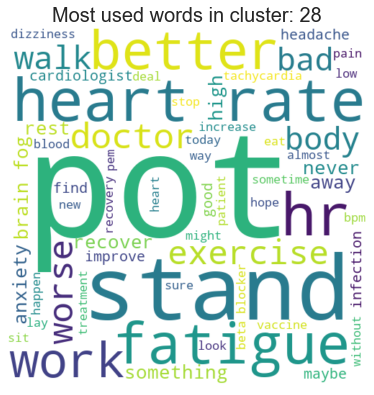

In [35]:
for i in range(0,29):
    create_wordcloud(df_clusters[df_clusters['cluster'] == i]['text'].to_list(), title="Most used words in cluster: " + str(i))